# Cross sectional regression

In [1]:
# packages and globals
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
# inline mat
%matplotlib inline
plt.rcParams['figure.dpi'] = 200
# plt.rcParams['figure.dpi'] = 300
import tushare as ts
ts.set_token('4167d168dd2c182108319b0f5fc93d66b21d5ccf2baa2af2a522b80d')
pro = ts.pro_api()

# quiet 执行不显示warning
import warnings
warnings.filterwarnings('ignore')

start_date = '2016-01-01'
end_date = '2023-01-01'

## Read pb roe

In [2]:
merge3 = pd.read_csv('merge3.csv')
# to datetime
merge3['trade_date'] = pd.to_datetime(merge3['trade_date'])
merge3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1390 entries, 0 to 1389
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   ts_code        1390 non-null   object        
 1   roe            1390 non-null   float64       
 2   trade_date     1390 non-null   datetime64[ns]
 3   turnover_rate  1390 non-null   float64       
 4   pb             1390 non-null   float64       
 5   log_pb         1390 non-null   float64       
dtypes: datetime64[ns](1), float64(4), object(1)
memory usage: 65.3+ KB


## Calculate residual

### 一起回归计算残差

In [44]:
# linear regression
from sklearn.linear_model import LinearRegression

reg = LinearRegression()
# fit
reg.fit(merge3[['roe']], merge3['log_pb'])
merge3['log_pb_pred'] = reg.predict(merge3[['roe']])
merge3['residual'] = merge3['log_pb'] - merge3['log_pb_pred']

### 对横截面分别回归

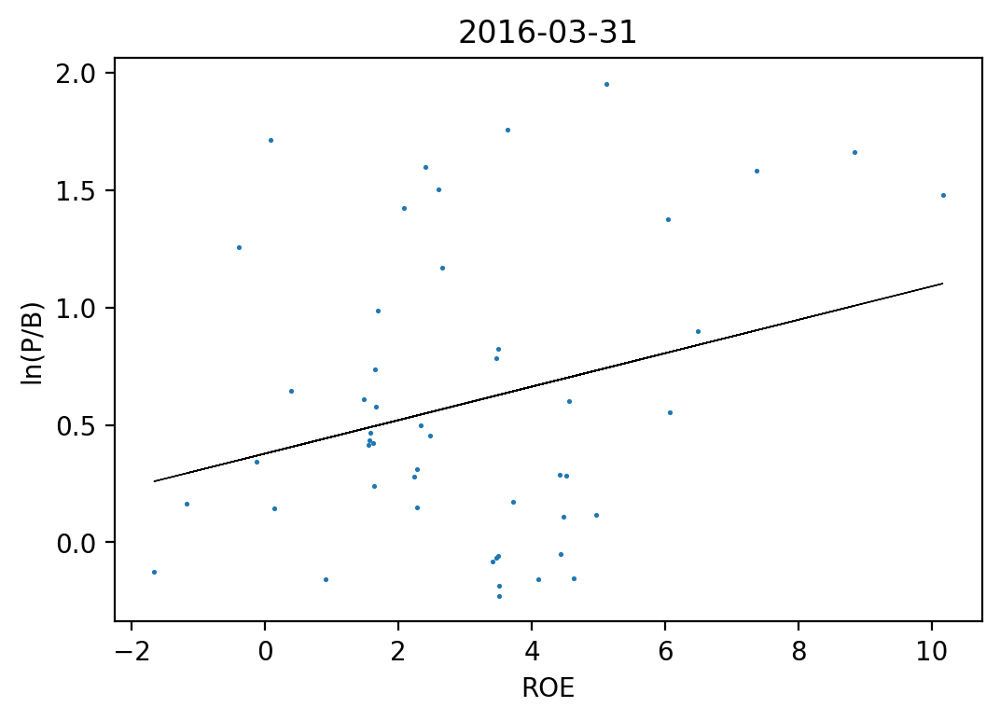

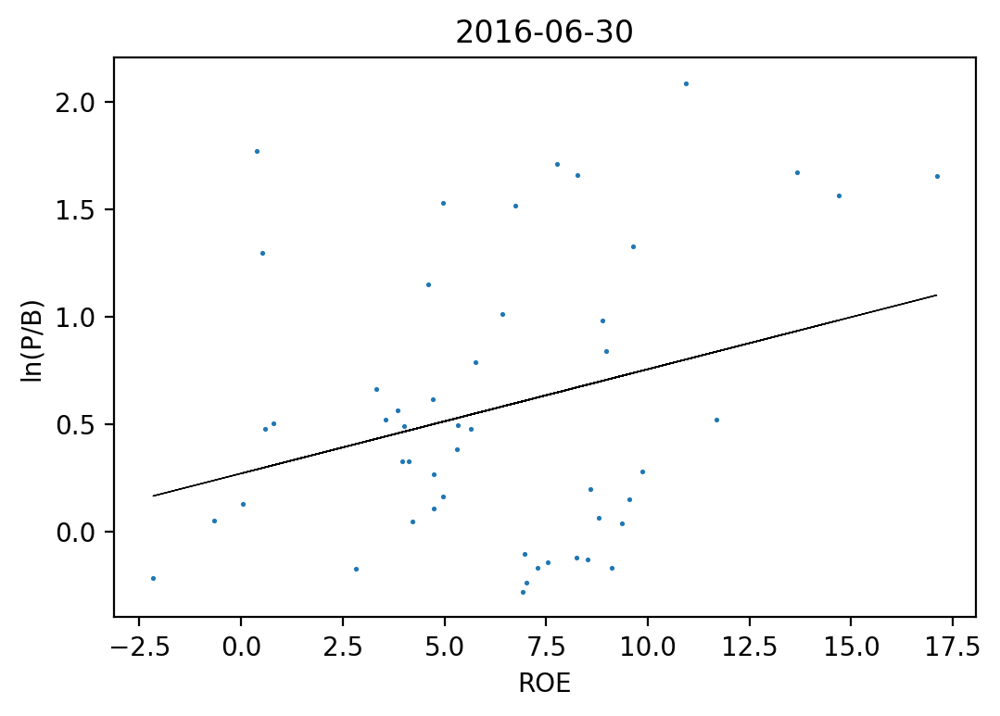

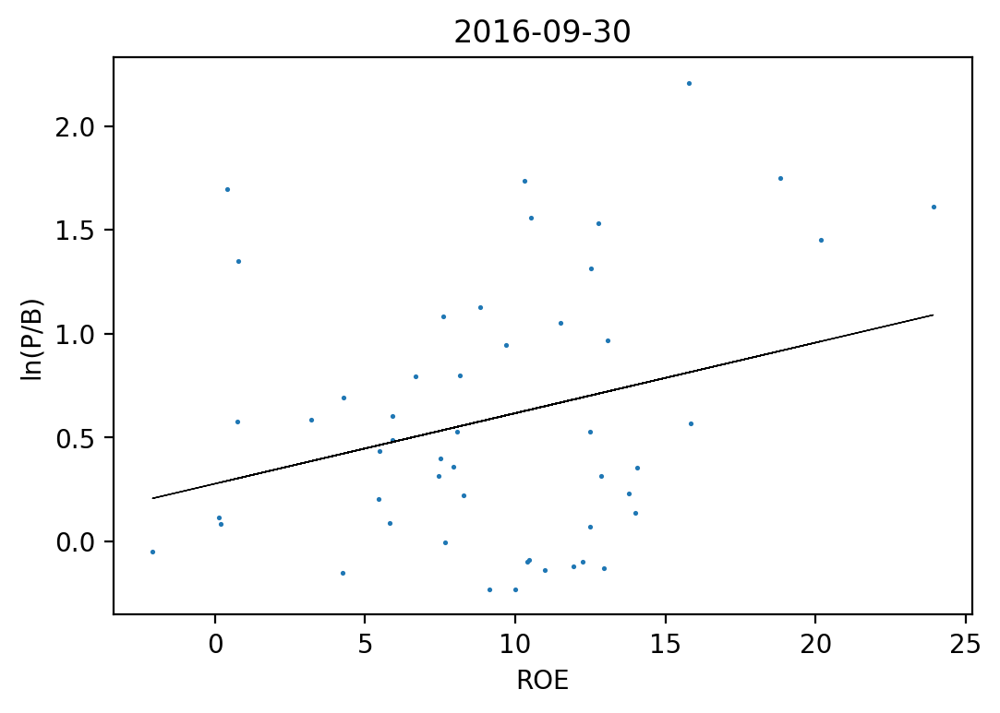

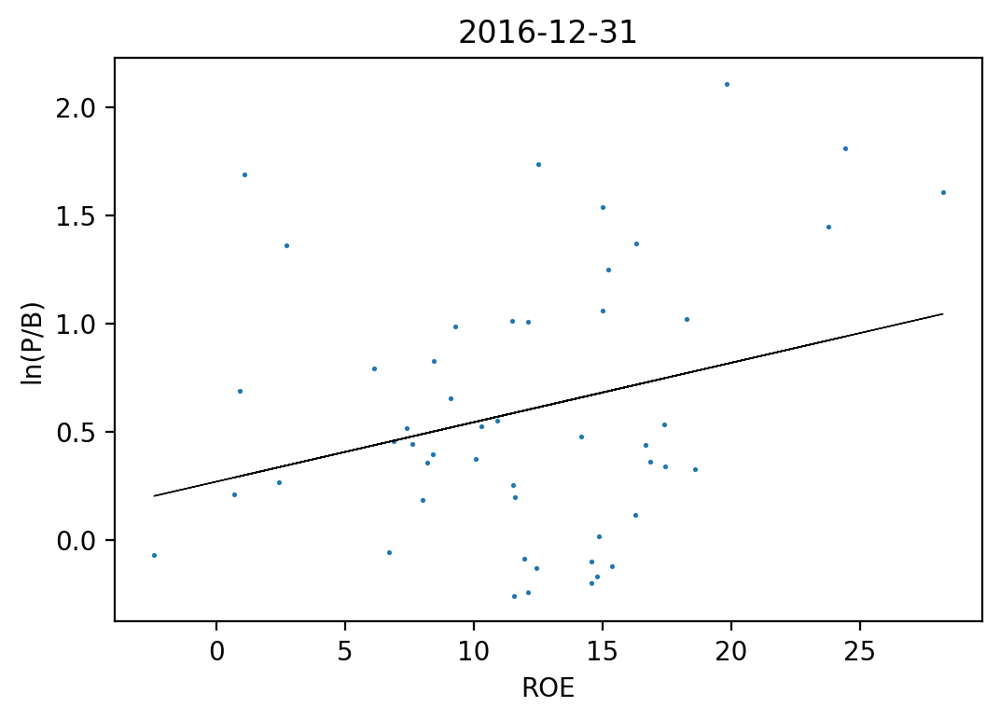

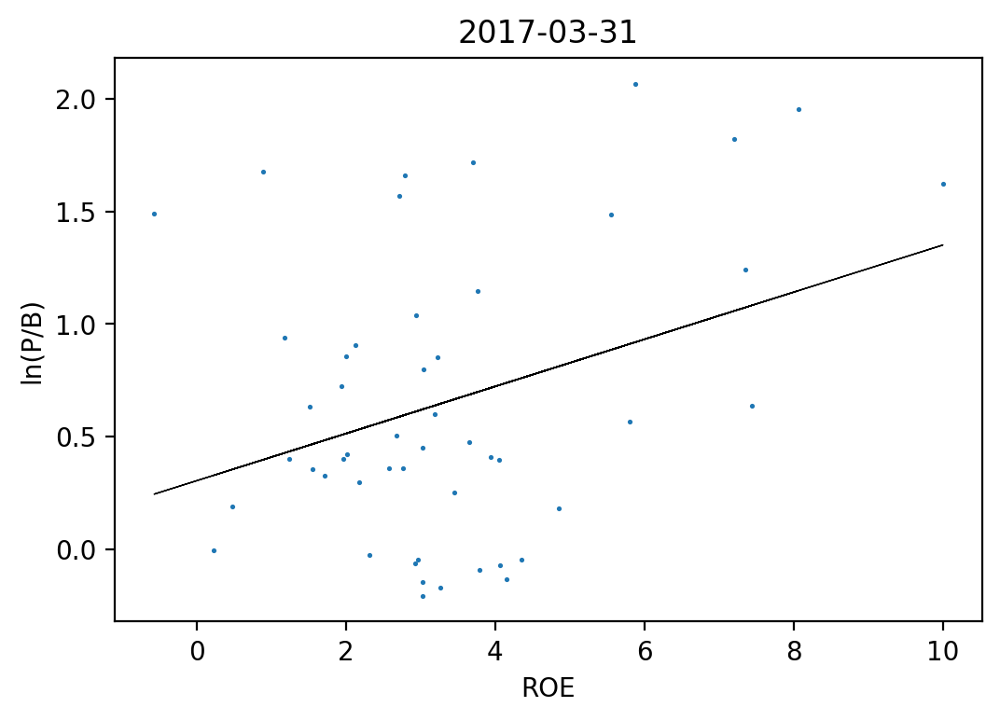

...

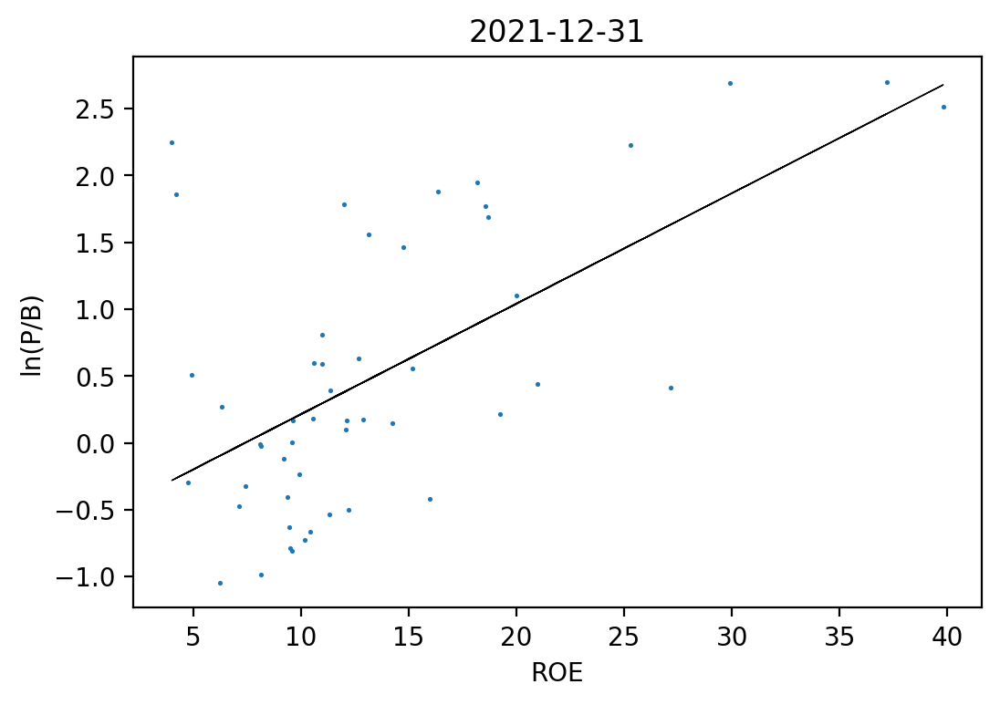

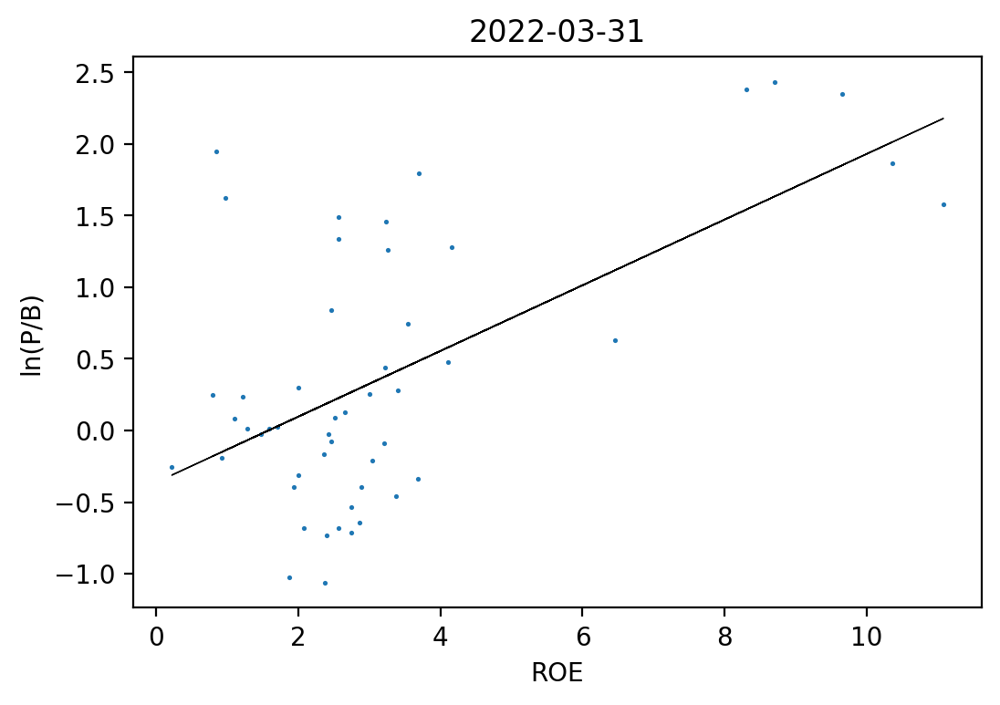

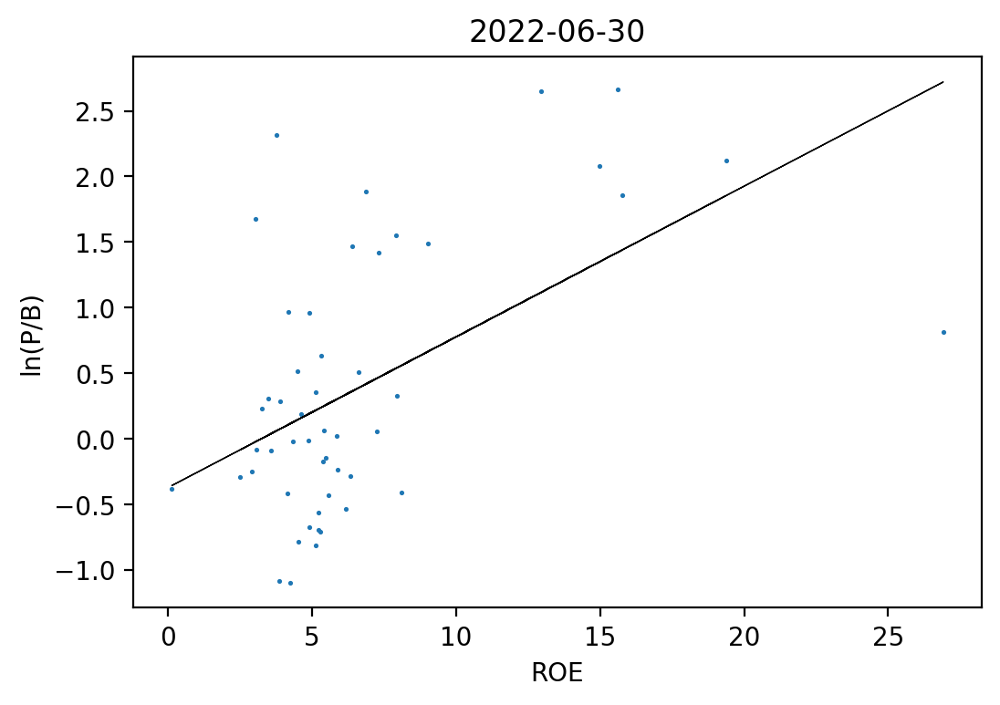

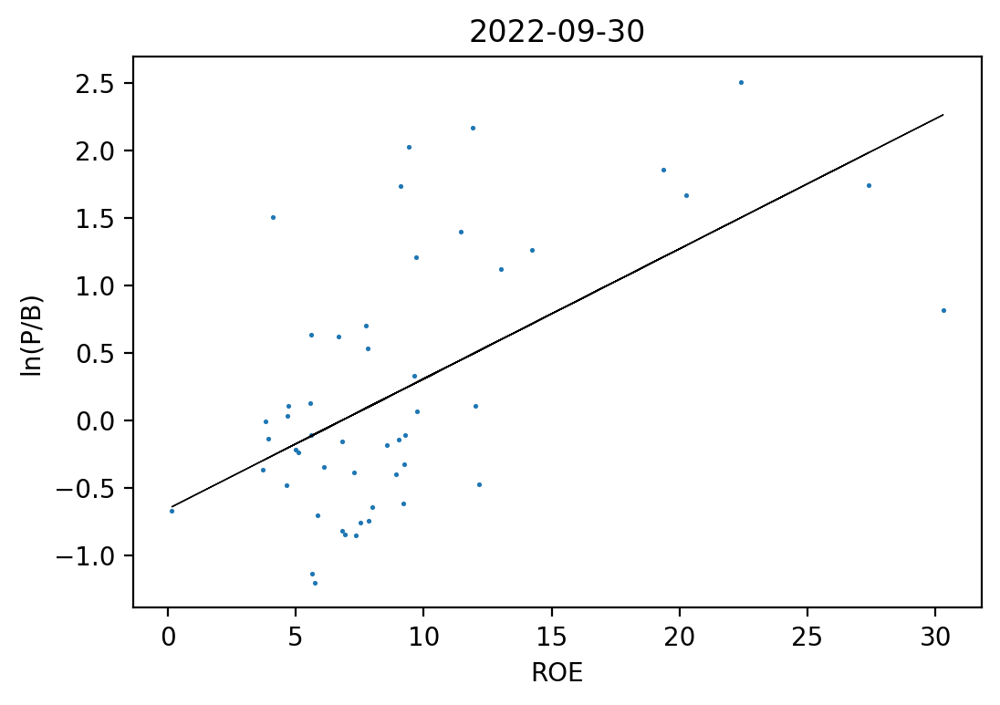

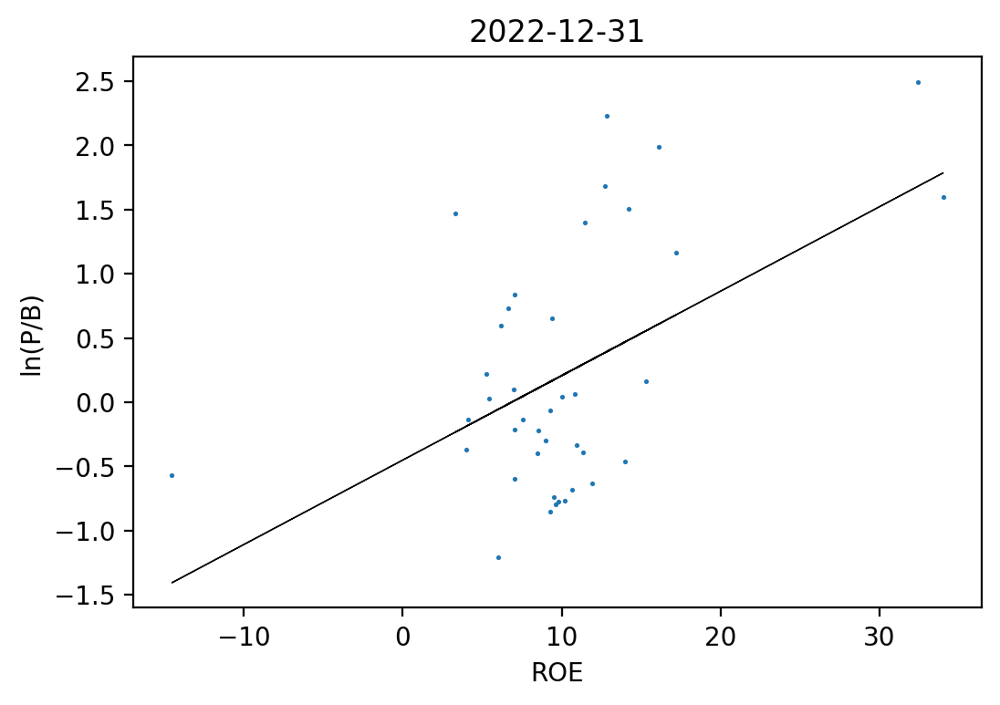

In [3]:
# linear regression
from sklearn.linear_model import LinearRegression

reg = LinearRegression()

# 对每个date进行回归
for date in merge3['trade_date'].unique():
    # create linear regression object
    reg = LinearRegression()
    # fit
    reg.fit(merge3[merge3['trade_date'] == date][['roe']], merge3[merge3['trade_date'] == date]['log_pb'])
    # print(reg.coef_)
    # print(reg.intercept_)
    merge3.loc[merge3['trade_date'] == date, 'residual'] = merge3[merge3['trade_date'] == date]['log_pb'] - reg.predict(merge3[merge3['trade_date'] == date][['roe']])
    # merge3.loc[merge3['trade_date'] == date, 'residual_abs'] = abs(merge3[merge3['trade_date'] == date]['log_pb'] - reg.predict(merge3[merge3['trade_date'] == date][['roe']]))
    # plot 
    plt.scatter(merge3[merge3['trade_date'] == date]['roe'], merge3[merge3['trade_date'] == date]['log_pb'],marker='.', s=3)
    plt.plot(merge3[merge3['trade_date'] == date]['roe'], reg.predict(merge3[merge3['trade_date'] == date][['roe']]), color='black',linewidth=0.5)
    plt.xlabel('ROE')
    plt.ylabel('ln(P/B)')
    # 年月日
    plt.title(date.astype('str')[:10])
    plt.show()
    plt.close()


## Reg res for each stock

### Read close data

In [46]:
# read
stocks300_df = pd.read_csv('kaggle/data.csv')
stocks300_df['datetime'] = pd.to_datetime(stocks300_df['datetime'])
# sort
stocks300_df = stocks300_df.sort_values(by=['ts_code', 'datetime'])
# 选取2016之后的
stocks300_df = stocks300_df[stocks300_df['datetime'] > start_date]
# 统计每个date有多少不同股票
# stocks300_df.groupby('datetime').ts_code.nunique().plot()
# 日期数量
num_dates = stocks300_df.datetime.nunique()
print('dates:', num_dates)
# 股票数量等于日期数量的股票
stocks = stocks300_df.groupby('ts_code').datetime.nunique()
# 保留等于num_dates的
stocks = stocks[stocks == num_dates].index
print('stocks:', len(stocks))
print(stocks)
# name datetime to trade_date
stocks300_df = stocks300_df.rename(columns={'datetime': 'trade_date'})
# 保留stocks中的股票
stocks300_df = stocks300_df[stocks300_df['ts_code'].isin(stocks)]


dates: 1703
stocks: 50
Index(['000001.SZ', '000069.SZ', '000157.SZ', '000725.SZ', '000768.SZ',
       '000776.SZ', '000858.SZ', '000963.SZ', '002007.SZ', '002008.SZ',
       '002241.SZ', '002304.SZ', '002594.SZ', '002736.SZ', '600015.SH',
       '600016.SH', '600028.SH', '600031.SH', '600036.SH', '600085.SH',
       '600104.SH', '600111.SH', '600519.SH', '600585.SH', '600660.SH',
       '600741.SH', '600837.SH', '600886.SH', '601006.SH', '601186.SH',
       '601211.SH', '601225.SH', '601288.SH', '601318.SH', '601328.SH',
       '601336.SH', '601398.SH', '601601.SH', '601618.SH', '601628.SH',
       '601668.SH', '601688.SH', '601788.SH', '601800.SH', '601857.SH',
       '601888.SH', '601939.SH', '601985.SH', '601988.SH', '601998.SH'],
      dtype='object', name='ts_code')


### Draw residual trend

In [47]:
stocks_res_reg_params = pd.DataFrame(columns=['ts_code', 'residual_avg','residual_coef', 'residual_intercept'])

for tic in stocks:
    # 生成time序列0,1,2,3
    merge3.loc[merge3['ts_code'] == tic, 'time'] = np.arange(len(merge3[merge3['ts_code'] == tic]))
    # 拟合
    reg.fit(merge3[merge3['ts_code'] == tic][['time']], merge3[merge3['ts_code'] == tic]['residual'])
    # 保存参数
    merge3.loc[merge3['ts_code'] == tic, 'residual_coef'] = reg.coef_[0]
    merge3.loc[merge3['ts_code'] == tic, 'residual_intercept'] = reg.intercept_
    stocks_res_reg_params = stocks_res_reg_params.append({'ts_code': tic, 'residual_avg': merge3.loc[merge3['ts_code'] == tic, 'residual'].mean(), 'residual_coef': reg.coef_[0], 'residual_intercept': reg.intercept_}, ignore_index=True)
    # residual_pred
    merge3.loc[merge3['ts_code'] == tic, 'residual_pred'] = reg.predict(merge3[merge3['ts_code'] == tic][['time']])

In [18]:
# 左边画merge3中601998.SH的residual趋势图，右边画stock300_df中对应的close趋势图
for tic in stocks:
    fig, ax = plt.subplots(1, 2, figsize=(15, 5))

    merge3[merge3['ts_code'] == tic].plot(x='trade_date', y='residual', ax=ax[0], marker='.')
    # 画residual_pred
    merge3[merge3['ts_code'] == tic].plot(x='trade_date', y='residual_pred', ax=ax[0], color='red', linestyle='--')
    # 画y=0的水平线
    ax[0].axhline(y=0, color='black', linestyle=':')    
    plt.legend()
    stocks300_df[stocks300_df['ts_code'] == tic].plot(x='trade_date', y='close', ax=ax[1], linewidth=0.4, c=(0.2, 0.2, 0.2))
    # 画moving average 平滑曲线，横坐标为trade_date与上面横坐标对齐
    # stocks300_df.loc[stocks300_df['ts_code'] == tic, 'MA20'] = stocks300_df[stocks300_df['ts_code'] == tic].close.rolling(20).mean().values
    # stocks300_df[stocks300_df['ts_code'] == tic].plot(x='trade_date', y='MA20',ax=ax[1], linewidth=1, c='red')
    # 画移动指数平均
    stocks300_df.loc[stocks300_df['ts_code'] == tic, 'EMA20'] = stocks300_df[stocks300_df['ts_code'] == tic].close.ewm(span=50).mean().values
    stocks300_df[stocks300_df['ts_code'] == tic].plot(x='trade_date', y='EMA20',ax=ax[1], linewidth=1, c='red')

    # title, 保留4位小数
    ax[0].set_title('residual\n' + '_coef= ' + str(round(merge3[merge3['ts_code'] == tic].residual_coef.values[0], 4)) + '   ' + '_intercept= ' + str(round(merge3[merge3['ts_code'] == tic].residual_intercept.values[0], 4)))
    ax[1].set_title('close price trend')
    # 总title
    plt.suptitle(tic)
    plt.savefig('residual_cross/figure/' + tic + '.png')
    plt.close()

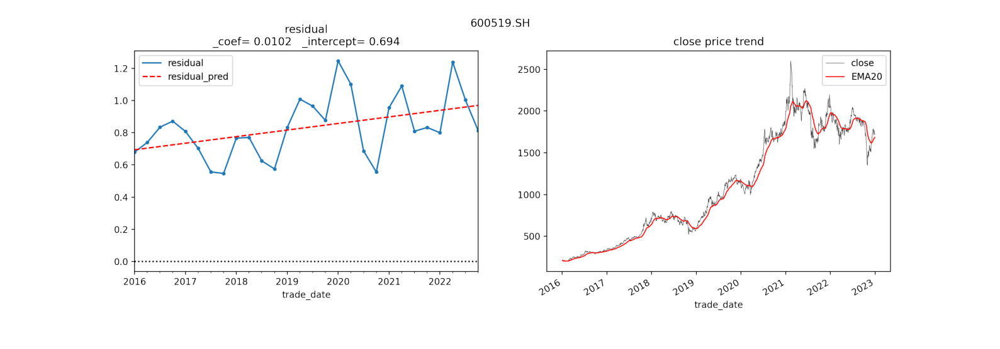

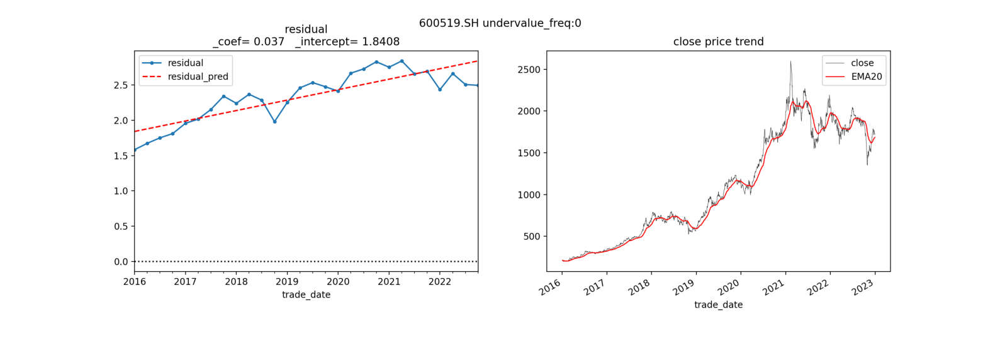

In [20]:
for tic in ['600519.SH']:
    plt.figure(figsize=(10, 5))
    plt.imshow(plt.imread('residual_cross/figure/' + tic + '.png'))
    plt.axis('off')
    plt.show()
    plt.figure(figsize=(10, 5))
    plt.imshow(plt.imread('residual/figure/' + tic + '.png'))
    plt.axis('off')
    plt.show()

In [ ]:
stocks_res_reg_params = stocks_res_reg_params.sort_values(by='residual_coef', ascending=False)
# reset index
stocks_res_reg_params = stocks_res_reg_params.reset_index(drop=True)
stocks_res_reg_params.to_csv('residual/stocks_res_reg_params.csv', index=False)
# pick coef > 0
# stocks_res_ascend = stocks_res_reg_params[stocks_res_reg_params['residual_coef'] > 0].ts_code.values
stocks_res_ascend = stocks_res_reg_params.ts_code.values

# 从文件读取这些股票的图片
for tic in stocks_res_ascend:
    plt.figure(figsize=(10, 5))
    plt.imshow(plt.imread('residual_cross/figure/' + tic + '.png'))
    plt.axis('off')
    plt.show()

## Momentum

### Cal moomentum

In [ ]:
# 时序动量 residual 变化量的移动指数加权平均
# 计算residual变化量
merge3['residual_diff'] = merge3.groupby('ts_code')['residual'].diff()
# dropna
merge3 = merge3.dropna()
# 计算residual_diff的移动指数加权平均
span = 6
EMA_key = 'residual_diff_EWMA' + str(span)
merge3[EMA_key] = merge3.groupby('ts_code')['residual_diff'].ewm(span=5).mean().values
# 画图
for tic in stocks:
    fig, ax = plt.subplots(1, 2, figsize=(15, 5))
    # plot residual
    merge3[merge3['ts_code'] == tic].plot(x='trade_date', y='residual', ax=ax[0], marker='.')
    # merge3[merge3['ts_code'] == tic].plot(x='trade_date', y='residual_diff', ax=ax[0], marker='.')
    merge3[merge3['ts_code'] == tic].plot(x='trade_date', y=EMA_key, ax=ax[0], color='red', linestyle='--')
    ax[0].axhline(y=0, color='black', linestyle=':')
    # 画x在2021年的垂直线
    ax[0].axvline(x='20210101', color='black', linestyle='dashdot')
    plt.legend()
    stocks300_df[stocks300_df['ts_code'] == tic].plot(x='trade_date', y='close', ax=ax[1], linewidth=0.4, c=(0.2, 0.2, 0.2))
    stocks300_df.loc[stocks300_df['ts_code'] == tic, 'EWMA'] = stocks300_df[stocks300_df['ts_code'] == tic].close.ewm(span=50).mean().values
    stocks300_df[stocks300_df['ts_code'] == tic].plot(x='trade_date', y='EWMA',ax=ax[1], linewidth=1, c='red')
    ax[1].axvline(x='20210101', color='black', linestyle='dashdot')
    ax[0].set_title('residual_diff')
    ax[1].set_title('close price trend')
    plt.suptitle(tic)
    plt.show()
    plt.close()
    # plt.savefig('residual_diff/figure/' + tic + '.png')
    # plt.close()

### Select stocks according to momentum 

In [57]:
date_train_end = '20201231'
stocks_train_end = merge3[merge3['trade_date'] == date_train_end][['ts_code','roe','pb','log_pb','residual','residual_diff_EWMA6']]
# sort by residual_diff_EWMA6
stocks_train_end = stocks_train_end.sort_values(by='residual_diff_EWMA6', ascending=False)
# index
stocks_train_end = stocks_train_end.reset_index(drop=True)
stocks_train_end.to_csv('res_mom.csv', index=False)

## previous regresion 

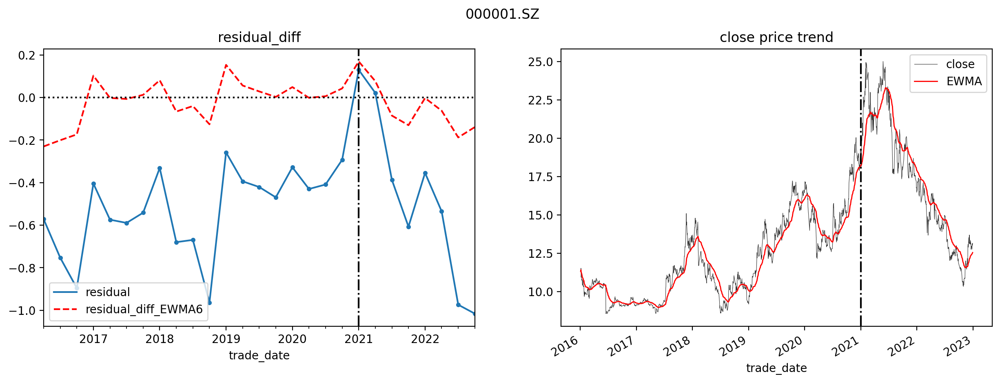

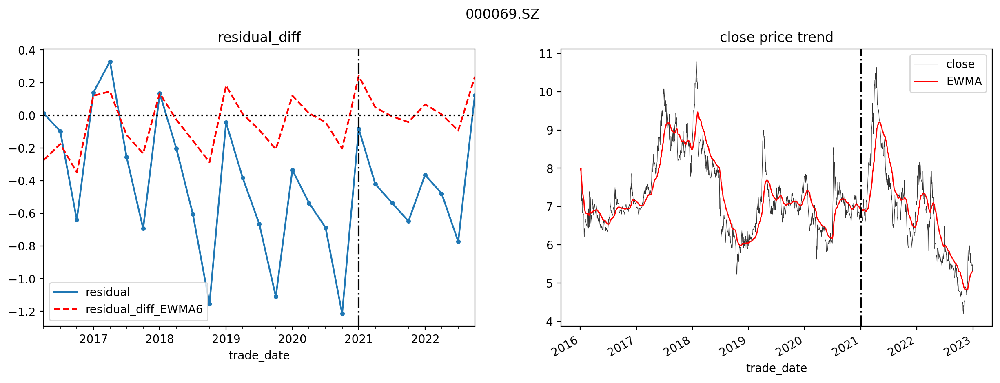

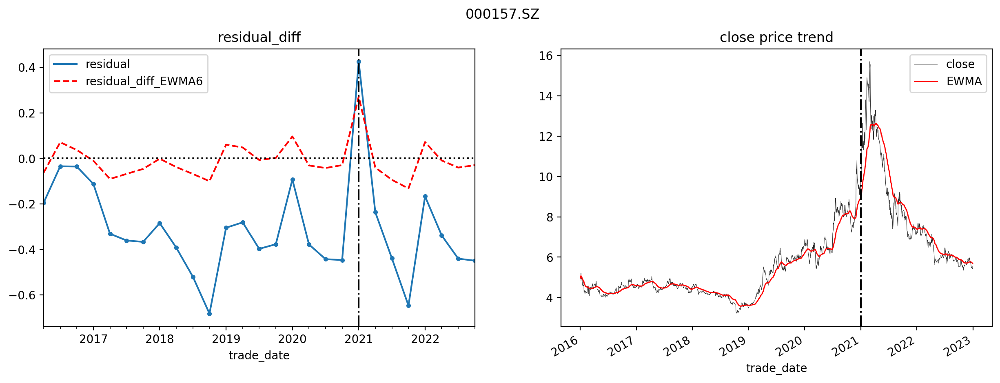

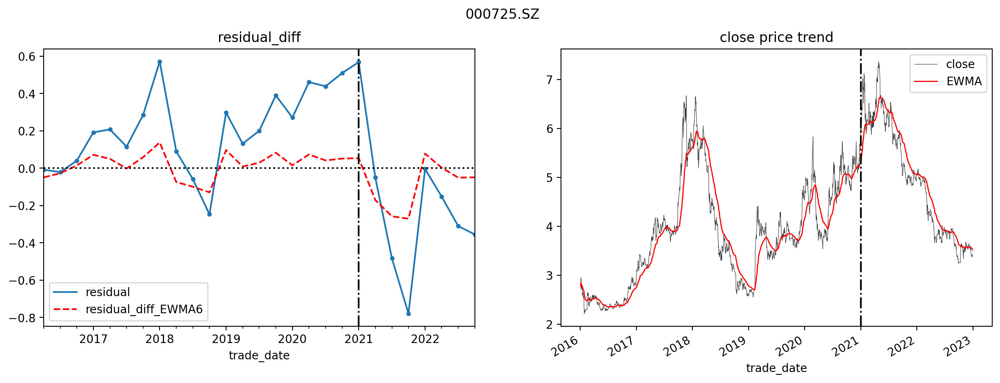

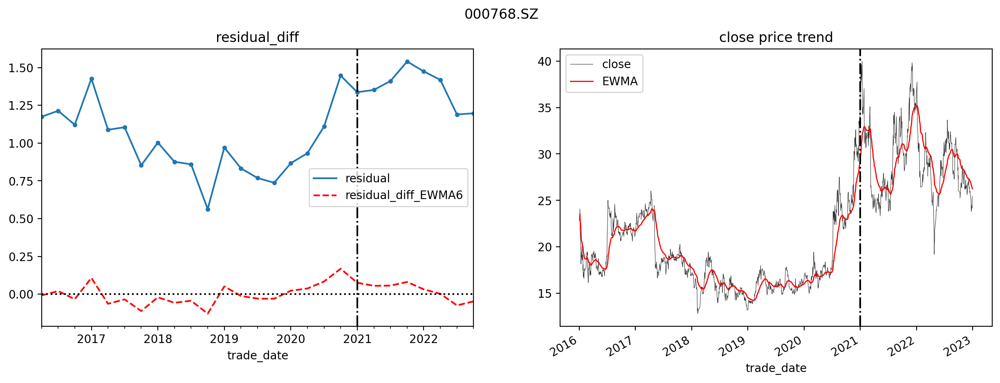

...

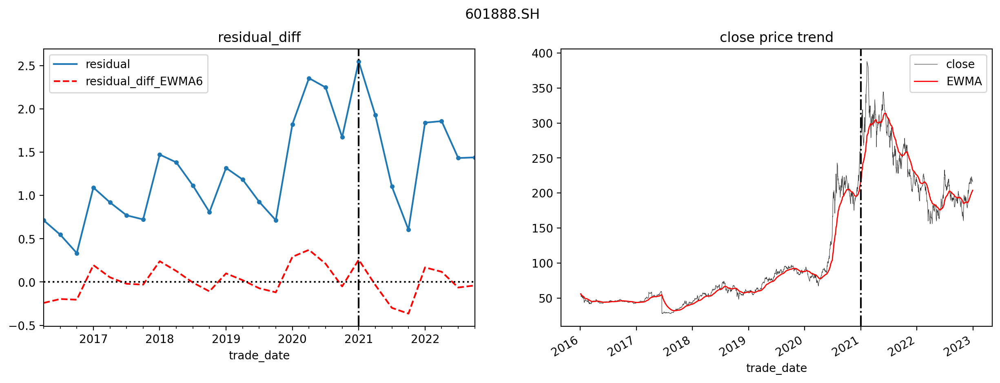

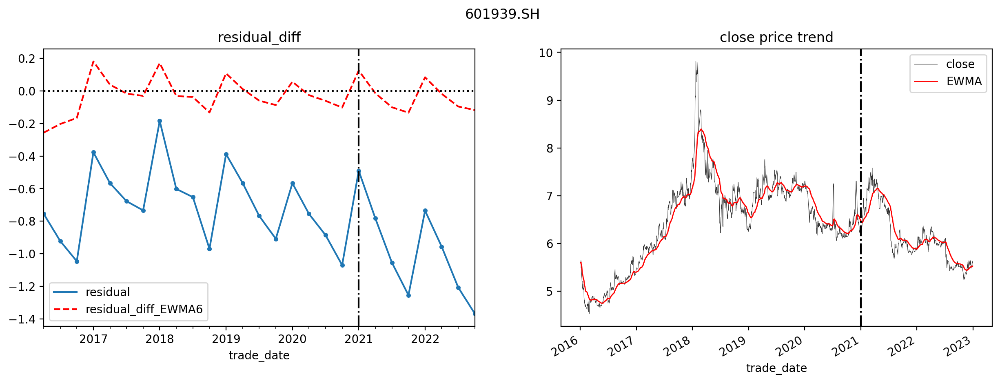

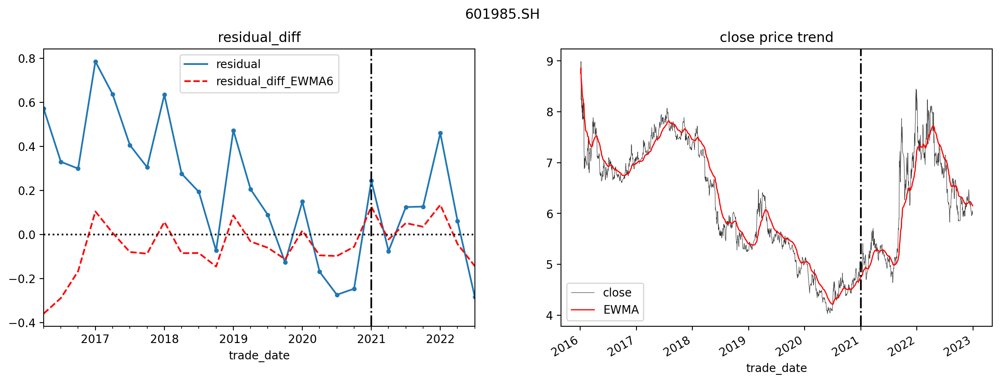

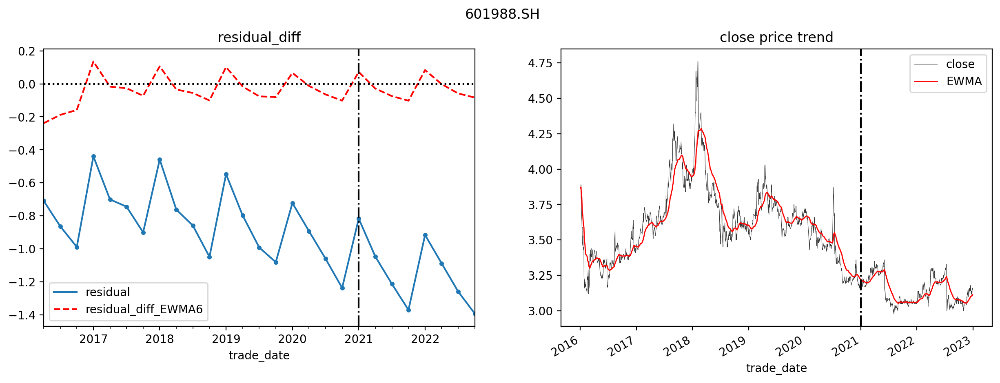

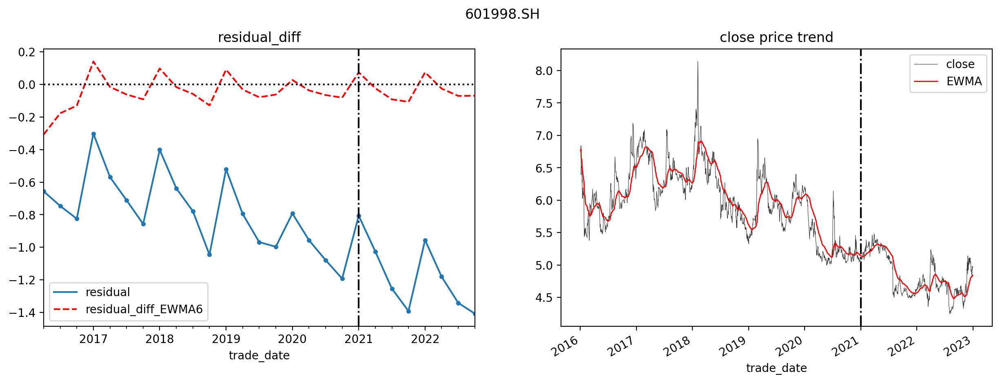

In [41]:
# 时序动量 residual 变化量的移动指数加权平均
# 计算residual变化量
merge3['residual_diff'] = merge3.groupby('ts_code')['residual'].diff()
# dropna
merge3 = merge3.dropna()
# 计算residual_diff的移动指数加权平均
span = 6
EMA_key = 'residual_diff_EWMA' + str(span)
merge3[EMA_key] = merge3.groupby('ts_code')['residual_diff'].ewm(span=5).mean().values
# 画图
for tic in stocks:
    fig, ax = plt.subplots(1, 2, figsize=(15, 5))
    # plot residual
    merge3[merge3['ts_code'] == tic].plot(x='trade_date', y='residual', ax=ax[0], marker='.')
    # merge3[merge3['ts_code'] == tic].plot(x='trade_date', y='residual_diff', ax=ax[0], marker='.')
    merge3[merge3['ts_code'] == tic].plot(x='trade_date', y=EMA_key, ax=ax[0], color='red', linestyle='--')
    ax[0].axhline(y=0, color='black', linestyle=':')
    # 画x在2021年的垂直线
    ax[0].axvline(x='20210101', color='black', linestyle='dashdot')
    plt.legend()
    stocks300_df[stocks300_df['ts_code'] == tic].plot(x='trade_date', y='close', ax=ax[1], linewidth=0.4, c=(0.2, 0.2, 0.2))
    stocks300_df.loc[stocks300_df['ts_code'] == tic, 'EWMA'] = stocks300_df[stocks300_df['ts_code'] == tic].close.ewm(span=50).mean().values
    stocks300_df[stocks300_df['ts_code'] == tic].plot(x='trade_date', y='EWMA',ax=ax[1], linewidth=1, c='red')
    ax[1].axvline(x='20210101', color='black', linestyle='dashdot')
    ax[0].set_title('residual_diff')
    ax[1].set_title('close price trend')
    plt.suptitle(tic)
    plt.show()
    # plt.savefig('residual_diff/figure/' + tic + '.png')
    # plt.close()